<h1 align="center"> Senior Well-being - The Twitter Project </h1>

----------------------------------------------------------------------------------------------------------------------

<h2> 1. Installing and importing the dependencies <h2>

In [105]:
!pip install transformers

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [109]:
!pip install bertopic

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
     |████████████████████████████████| 90 kB 6.9 MB/s eta 0:00:011
     |████████████████████████████████| 5.2 MB 5.2 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 88 kB 13.2 MB/s eta 0:00:01
     |████████████████████████████████| 1.1 MB 16.2 MB/s eta 0:00:01
  Created wheel for hdbscan: filename=hdbscan-0.8.29-cp39-cp39-macosx_10_9_x86_64.whl size=658343 sha256=787be322035f967c436b19865387bbc6f57e5b4ea11be32a7e87e4e54dd64273
  Stored in directory: /Users/seshu/Library/Caches/pip/wheels/05/6f/88/1a4c04276b98306f00217a1e300e6ba0252c

In [111]:
!pip install bertopic[visualization] --quiet

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
zsh:1: no matches found: bertopic[visualization]
Note: you may need to restart the kernel to use updated packages.


In [68]:
!pip install scipy

In [2]:
#import necessary packages
import pandas as pd
import numpy as np
import preprocessor as p
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import tensorflow_hub as hub
import tensorflow_text as text
from scipy import spatial
from transformers import pipeline
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from scipy.special import softmax
import torch
from copy import deepcopy
from bertopic import BERTopic
import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud 
nltk.download('stopwords')
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /Users/seshu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/seshu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [26]:
#loading the tweet dataset
df = pd.read_csv("/Users/seshu/Desktop/Summer langara/twitter project/03_twitter/03_01_data/cleaned_data/cleaned_elderly_tweets.csv")
df.shape

(57139, 9)

In [27]:
#viewing the dataset
df.head()

,tweet_id,date_time,author_id,place_id,place_name,region,tweet_text,cleaned_text,hashtags
0,1.496960e+18,2022-02-24T21:33:19.000Z,3.240659e+09,38d5974e82ed1a6c,"Ottawa, Ontario",Ontario,@JosephConwell7 @Reuters I live here &amp; the...,I live here and these far right bully boys pic...,[]
1,1.496950e+18,2022-02-24T20:28:33.000Z,1.469170e+18,0811cf61cd9ea52f,"Winnipeg, Manitoba",Manitoba,"Winnipeg seniors, wya?!! \nI’m doing Mini sess...","Winnipeg seniors, wya?!! Im doing Mini session...","['winnipeg', 'collegegrad']"
2,1.496940e+18,2022-02-24T20:25:13.000Z,3.355189e+09,3797791ff9c0e4c6,"Toronto, Ontario",Ontario,This is no joke. I have gone to several stores...,This is no joke. I have gone to several stores...,[]
3,1.496930e+18,2022-02-24T19:44:18.000Z,2.130565e+07,3797791ff9c0e4c6,"Toronto, Ontario",Ontario,@cllrainslie Vaccines are great for the elderl...,Vaccines are great for the elderly and / or th...,[]
4,1.496920e+18,2022-02-24T18:53:50.000Z,5.038248e+07,71bdc845bc7609c7,"Woodstock, Ontario",Ontario,Be part of the movement from hallway care to h...,Be part of the movement from hallway care to h...,"['Woodstock', 'Healthcare']"


<h2>2. Text Pre-processing<h2>

In [7]:
#retrieving tweet_text column into a new dataframe
df_text = df[["tweet_text"]]

In [8]:
#viewing the dataset
df_text.head()

,tweet_text
0,@JosephConwell7 @Reuters I live here &amp; the...
1,"Winnipeg seniors, wya?!! \nI’m doing Mini sess..."
2,This is no joke. I have gone to several stores...
3,@cllrainslie Vaccines are great for the elderl...
4,Be part of the movement from hallway care to h...


In [9]:
#method to clean tweets
def clean_tweet(tweet):
    """
    The function takes dataset with tweets as input and returns clean tweets by applying all the below defined methods
    """
   
    #Cleaning tweets by removing URL, Mentions, Emoji's and Smileys using tweet-preprocessor. 
    p.set_options(p.OPT.URL, p.OPT.MENTION, p.OPT.EMOJI, p.OPT.SMILEY)
    tweet = p.clean(tweet)
    
    #lower case
    tweet = tweet.lower()
    
    #replacing ampersand with and
    tweet = tweet.replace('&amp;', 'and')
    
    #removing punctuations
    tweet = re.sub(r'[^\w\s]', '', tweet)
    
    #removing numbers
    pattern = r'[0-9]'
    tweet = re.sub(pattern, '', tweet)
      
    return tweet

In [10]:
#applying the above method on the tweets
clean_tweet = pd.DataFrame(df_text['tweet_text'].apply(clean_tweet))

In [11]:
#removing stop words
nltk.download('stopwords')
stop_words = stopwords.words('english')
clean_tweet['tweet_text'] = clean_tweet['tweet_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

[nltk_data] Downloading package stopwords to /Users/seshu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [12]:
#applying lemmetization
nltk.download('wordnet')
nltk.download('omw-1.4')
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

def lemmatize(text):
    return [' '.join(lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text))]

clean_tweet['tweet_text'] = clean_tweet['tweet_text'].apply(lemmatize)
clean_tweet['tweet_text'] = clean_tweet['tweet_text'].str[0]

[nltk_data] Downloading package wordnet to /Users/seshu/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/seshu/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [13]:
#viewing the dataset
clean_tweet

,tweet_text
0,live far right bully boy picked poor elderly v...
1,winnipeg senior wya im mini session starting m...
2,joke gone several store today try buy incontin...
3,vaccine great elderly sick
4,part movement hallway care home care help agin...
...,...
57134,lived india month amount senior begging scrap ...
57135,refugee get nowhere close lie repeatedly debun...
57136,old woman find attractive
57137,forgot favourite story


In [14]:
#saving the dataset to local path
clean_tweet.to_csv('/Users/seshu/Desktop/final langara/twitter/clean_tweet.csv')

In [19]:
#loading the tweet dataset
clean_tweet = pd.read_csv("/Users/seshu/Desktop/final langara/twitter/clean_tweet.csv")
clean_tweet.shape

(57139, 2)

In [20]:
#ignoring  columns other than tweets
clean_tweet = clean_tweet[['tweet_text']]

In [21]:
#viewing the dataset
clean_tweet

,tweet_text
0,live far right bully boy picked poor elderly v...
1,winnipeg senior wya im mini session starting m...
2,joke gone several store today try buy incontin...
3,vaccine great elderly sick
4,part movement hallway care home care help agin...
...,...
57134,lived india month amount senior begging scrap ...
57135,refugee get nowhere close lie repeatedly debun...
57136,old woman find attractive
57137,forgot favourite story


In [22]:
#for future reference
#clean_tweet2 = clean_tweet

In [23]:
#dropping NA rows
clean_tweet=clean_tweet.dropna(axis=0)

<h2> 3. Generating Text embeddings using BERT <h2>

In [4]:
#storing the path to BERT preprocessor and emncoder from tensorflow hub
preprocess_url = "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3"
encoder_url = "https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4"

In [5]:
#loading the BERT preprocessor and the BERT model
bert_preprocess_model = hub.KerasLayer(preprocess_url)
bert_model = hub.KerasLayer(encoder_url)

2022-11-09 23:01:18.767572: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [21]:
bert_model

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x7f7ee24d7f70>

In [43]:
#method to create text embeddings batch wise using BERT
def text_embeddings(data):
    
    """
    the function aims at vectorizing the twitter data using BERT algorithm. Since the data is huge, the algorithm 
    has been implemented batch wise. The method finally returns the text embeddings as a dataset
    """
    
    x = 0
    i = 0
    j = 1000
    
    text_embeds = pd.DataFrame()
    
    while x<58:
        
        clean_tweet_sub = data.iloc[i:j]
        text_test = clean_tweet_sub['tweet_text']
        text_preprocessed = bert_preprocess_model(text_test)
        bert_results = bert_model(text_preprocessed)
        df = pd.DataFrame(bert_results['pooled_output'])
        text_embeds = text_embeds.append(df)
        text_embeds.to_csv('/Users/seshu/Desktop/final langara/twitter/text_embeds.csv')
        x = x+1
        i = j
        j= j + 1000 
        
    return text_embeds

In [44]:
#calling the function on the tweets
text_embeds = text_embeddings(clean_tweet)

/var/folders/kj/kyh4f_jn3hj9hz17g3f89t6c0000gp/T/ipykernel_1509/530280526.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  text_embeds = text_embeds.append(df)
/var/folders/kj/kyh4f_jn3hj9hz17g3f89t6c0000gp/T/ipykernel_1509/530280526.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  text_embeds = text_embeds.append(df)
/var/folders/kj/kyh4f_jn3hj9hz17g3f89t6c0000gp/T/ipykernel_1509/530280526.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  text_embeds = text_embeds.append(df)
/var/folders/kj/kyh4f_jn3hj9hz17g3f89t6c0000gp/T/ipykernel_1509/530280526.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  text_embeds = text_embeds

In [45]:
#viewing the text embeddings created
text_embeds

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.724969,-0.463523,-0.689806,0.585289,0.309664,-0.165804,0.824189,0.407426,-0.195643,-0.999973,...,0.447283,0.284630,0.793497,0.788703,0.397808,0.210097,0.504007,-0.008866,-0.631152,0.852378
1,-0.784360,-0.368201,-0.653496,0.594188,0.482902,-0.041252,0.754498,0.149380,-0.231625,-0.999919,...,0.513107,-0.178933,0.760673,0.858754,-0.170773,0.286946,0.602009,-0.286991,-0.591507,0.805899
2,-0.790537,-0.333817,-0.350816,0.647367,0.089497,-0.037476,0.836057,0.365688,-0.124014,-0.999934,...,0.443743,0.381295,0.487425,0.784067,0.429223,0.424374,0.525373,0.014386,-0.625516,0.896847
3,-0.864067,-0.244504,-0.463359,0.755644,-0.077334,-0.106178,0.873119,0.185937,0.013838,-0.999955,...,0.350726,0.413860,0.466307,0.856560,-0.064665,0.505472,0.518508,-0.171498,-0.490195,0.848109
4,-0.859713,-0.385021,-0.709149,0.709417,0.161815,-0.163241,0.819723,0.282786,-0.197210,-0.999982,...,0.512880,-0.147973,0.750285,0.852683,-0.054917,0.290536,0.544126,-0.113779,-0.571124,0.826573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,-0.795929,-0.381578,-0.295704,0.587522,0.060062,-0.133092,0.799017,0.307465,-0.095124,-0.999924,...,0.283579,0.204775,0.543857,0.841148,0.638118,0.616492,0.409932,-0.111211,-0.540954,0.864017
126,-0.825793,-0.207891,-0.184493,0.628463,0.130244,-0.041460,0.844690,0.202142,-0.061824,-0.999913,...,0.352397,0.512310,0.403764,0.794175,-0.227378,0.367068,0.469355,-0.178577,-0.534190,0.833113
127,-0.843959,-0.285836,-0.432427,0.849632,0.444270,-0.220850,0.921107,0.234292,-0.115090,-0.999888,...,0.207503,0.155166,0.811388,0.873579,-0.580124,0.598631,0.371058,-0.458080,-0.601675,0.906991
128,-0.802252,-0.258096,0.480653,0.566966,-0.286976,-0.148867,0.866161,0.203475,0.157380,-0.999617,...,0.293993,0.283470,0.116320,0.826591,0.322539,0.568494,0.413305,0.513774,-0.587145,0.842438


In [56]:
#correcting the index
text_embeds.index = np.arange(0, len(text_embeds))

In [57]:
#viewing the dataset
text_embeds

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.724969,-0.463523,-0.689806,0.585289,0.309664,-0.165804,0.824189,0.407426,-0.195643,-0.999973,...,0.447283,0.284630,0.793497,0.788703,0.397808,0.210097,0.504007,-0.008866,-0.631152,0.852378
1,-0.784360,-0.368201,-0.653496,0.594188,0.482902,-0.041252,0.754498,0.149380,-0.231625,-0.999919,...,0.513107,-0.178933,0.760673,0.858754,-0.170773,0.286946,0.602009,-0.286991,-0.591507,0.805899
2,-0.790537,-0.333817,-0.350816,0.647367,0.089497,-0.037476,0.836057,0.365688,-0.124014,-0.999934,...,0.443743,0.381295,0.487425,0.784067,0.429223,0.424374,0.525373,0.014386,-0.625516,0.896847
3,-0.864067,-0.244504,-0.463359,0.755644,-0.077334,-0.106178,0.873119,0.185937,0.013838,-0.999955,...,0.350726,0.413860,0.466307,0.856560,-0.064665,0.505472,0.518508,-0.171498,-0.490195,0.848109
4,-0.859713,-0.385021,-0.709149,0.709417,0.161815,-0.163241,0.819723,0.282786,-0.197210,-0.999982,...,0.512880,-0.147973,0.750285,0.852683,-0.054917,0.290536,0.544126,-0.113779,-0.571124,0.826573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57125,-0.795929,-0.381578,-0.295704,0.587522,0.060062,-0.133092,0.799017,0.307465,-0.095124,-0.999924,...,0.283579,0.204775,0.543857,0.841148,0.638118,0.616492,0.409932,-0.111211,-0.540954,0.864017
57126,-0.825793,-0.207891,-0.184493,0.628463,0.130244,-0.041460,0.844690,0.202142,-0.061824,-0.999913,...,0.352397,0.512310,0.403764,0.794175,-0.227378,0.367068,0.469355,-0.178577,-0.534190,0.833113
57127,-0.843959,-0.285836,-0.432427,0.849632,0.444270,-0.220850,0.921107,0.234292,-0.115090,-0.999888,...,0.207503,0.155166,0.811388,0.873579,-0.580124,0.598631,0.371058,-0.458080,-0.601675,0.906991
57128,-0.802252,-0.258096,0.480653,0.566966,-0.286976,-0.148867,0.866161,0.203475,0.157380,-0.999617,...,0.293993,0.283470,0.116320,0.826591,0.322539,0.568494,0.413305,0.513774,-0.587145,0.842438


<h2> 4. Identify irrelevant tweets using cosine score <h2>

In [46]:
#model statement to compare against
verify = ['senior citizen Old man aged woman elderly adults']

In [47]:
#pre processing the model statement for BERT
text_prepro = bert_preprocess_model(verify)

In [48]:
#applying BERT and generating embeddings
bert_result = bert_model(text_prepro)
df_compare = pd.DataFrame(bert_result['pooled_output'])

In [49]:
#viewing the text embeddings generated
df_compare

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.77432,-0.51954,-0.777442,0.759136,0.56443,-0.193407,0.905021,0.314596,-0.4182,-0.99998,...,0.415638,-0.040227,0.904708,0.863986,-0.356537,0.167329,0.476313,-0.385161,-0.617537,0.836834


In [43]:
#loading BERT text embeddings
text_embeds = pd.read_csv("/Users/seshu/Desktop/final langara/twitter/text_embeds.csv")
text_embeds.shape

(57130, 769)

In [45]:
#viewing text embeddings
text_embeds = text_embeds.iloc[: , 1:]
text_embeds

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.724969,-0.463523,-0.689805,0.585289,0.309664,-0.165804,0.824189,0.407426,-0.195642,-0.999973,...,0.447283,0.284630,0.793497,0.788703,0.397808,0.210097,0.504007,-0.008866,-0.631152,0.852378
1,-0.784360,-0.368201,-0.653496,0.594188,0.482902,-0.041252,0.754498,0.149380,-0.231625,-0.999919,...,0.513107,-0.178933,0.760673,0.858754,-0.170773,0.286946,0.602008,-0.286991,-0.591507,0.805899
2,-0.790537,-0.333817,-0.350816,0.647367,0.089497,-0.037476,0.836057,0.365688,-0.124014,-0.999934,...,0.443743,0.381295,0.487425,0.784067,0.429223,0.424374,0.525373,0.014386,-0.625516,0.896847
3,-0.864067,-0.244505,-0.463359,0.755644,-0.077334,-0.106178,0.873119,0.185937,0.013838,-0.999955,...,0.350726,0.413860,0.466307,0.856560,-0.064665,0.505472,0.518508,-0.171498,-0.490195,0.848109
4,-0.859713,-0.385021,-0.709149,0.709417,0.161815,-0.163241,0.819723,0.282786,-0.197210,-0.999982,...,0.512880,-0.147973,0.750285,0.852683,-0.054917,0.290536,0.544126,-0.113779,-0.571124,0.826573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57125,-0.795929,-0.381578,-0.295704,0.587522,0.060062,-0.133092,0.799017,0.307465,-0.095124,-0.999924,...,0.283579,0.204775,0.543857,0.841148,0.638118,0.616492,0.409932,-0.111211,-0.540954,0.864017
57126,-0.825793,-0.207891,-0.184493,0.628463,0.130244,-0.041460,0.844690,0.202142,-0.061824,-0.999913,...,0.352397,0.512310,0.403764,0.794175,-0.227378,0.367068,0.469355,-0.178577,-0.534190,0.833113
57127,-0.843959,-0.285836,-0.432427,0.849632,0.444270,-0.220850,0.921107,0.234292,-0.115090,-0.999888,...,0.207503,0.155166,0.811388,0.873579,-0.580124,0.598631,0.371058,-0.458080,-0.601675,0.906991
57128,-0.802252,-0.258096,0.480653,0.566966,-0.286976,-0.148867,0.866161,0.203475,0.157380,-0.999617,...,0.293993,0.283470,0.116320,0.826591,0.322539,0.568494,0.413305,0.513774,-0.587145,0.842438


In [50]:
#creating an empty list to save cosine scores
cos_list = list()

#generating cosine score for each statement with reference to model statment's embeddings
for i in range(57130):
    result = 1 - spatial.distance.cosine(df_compare, text_embeds.iloc[i])
    cos_list.append(result)

In [51]:
#cosine scores
cos_list

[0.9810899359087463,
 0.9723505069991072,
 0.9553590136806633,
 0.9321318657541782,
 0.9773007708672398,
 0.9375607063827046,
 0.9548802099432641,
 0.9748009593831658,
 0.9787299145304489,
 0.9724415731901944,
 0.9696148005156451,
 0.9701203960764644,
 0.941678941282469,
 0.9255961091186335,
 0.9546520838502488,
 0.9792560090726143,
 0.9807706304904323,
 0.9403722857270601,
 0.9847628766336128,
 0.8763765587096908,
 0.9730309379607703,
 0.985249854956274,
 0.9530363083398637,
 0.9556673225456374,
 0.7356657544262518,
 0.9677663538131644,
 0.9817828408012957,
 0.9724896613842128,
 0.9717396667292402,
 0.9734482970049362,
 0.9720925755138081,
 0.8965615775523679,
 0.986221584450793,
 0.9783872325477865,
 0.9432145372715891,
 0.9821960350523078,
 0.9390488979692396,
 0.9591834966895068,
 0.9706018881416938,
 0.9309240825341143,
 0.9679597804390507,
 0.8768558265803366,
 0.9765817809481071,
 0.9469685818131561,
 0.9737903310298758,
 0.9725836343329607,
 0.9685022712658224,
 0.9457963723291

In [53]:
#creating a new dataframe with time and region
df2 = df[['date_time', 'region']]

In [54]:
#viewing the clean tweet dataset
clean_tweet2

,tweet_text
0,live far right bully boy picked poor elderly v...
1,winnipeg senior wya im mini session starting m...
2,joke gone several store today try buy incontin...
3,vaccine great elderly sick
4,part movement hallway care home care help agin...
...,...
57134,lived india month amount senior begging scrap ...
57135,refugee get nowhere close lie repeatedly debun...
57136,old woman find attractive
57137,forgot favourite story


In [55]:
#merging the df2 and clean_tweet2
cosi = pd.concat([clean_tweet2, df2], axis=1, ignore_index=False)
cosi

,tweet_text,date_time,region
0,live far right bully boy picked poor elderly v...,2022-02-24T21:33:19.000Z,Ontario
1,winnipeg senior wya im mini session starting m...,2022-02-24T20:28:33.000Z,Manitoba
2,joke gone several store today try buy incontin...,2022-02-24T20:25:13.000Z,Ontario
3,vaccine great elderly sick,2022-02-24T19:44:18.000Z,Ontario
4,part movement hallway care home care help agin...,2022-02-24T18:53:50.000Z,Ontario
...,...,...,...
57134,lived india month amount senior begging scrap ...,2018-01-01T14:36:44.000Z,British Columbia
57135,refugee get nowhere close lie repeatedly debun...,2018-01-01T06:29:56.000Z,Alberta
57136,old woman find attractive,2018-01-01T05:29:42.000Z,Manitoba
57137,forgot favourite story,2018-01-01T03:08:09.000Z,Nova Scotia


In [56]:
#dropping rows where tweet_text is NA
cosi = cosi[cosi['tweet_text'].notna()]
cosi.shape

(57130, 3)

In [57]:
#adding cosine scores to the dataset
cosi['cos'] = cos_list

/var/folders/kj/kyh4f_jn3hj9hz17g3f89t6c0000gp/T/ipykernel_6510/2200617208.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cosi['cos'] = cos_list


In [58]:
cosi

,tweet_text,date_time,region,cos
0,live far right bully boy picked poor elderly v...,2022-02-24T21:33:19.000Z,Ontario,0.981090
1,winnipeg senior wya im mini session starting m...,2022-02-24T20:28:33.000Z,Manitoba,0.972351
2,joke gone several store today try buy incontin...,2022-02-24T20:25:13.000Z,Ontario,0.955359
3,vaccine great elderly sick,2022-02-24T19:44:18.000Z,Ontario,0.932132
4,part movement hallway care home care help agin...,2022-02-24T18:53:50.000Z,Ontario,0.977301
...,...,...,...,...
57134,lived india month amount senior begging scrap ...,2018-01-01T14:36:44.000Z,British Columbia,0.929389
57135,refugee get nowhere close lie repeatedly debun...,2018-01-01T06:29:56.000Z,Alberta,0.913209
57136,old woman find attractive,2018-01-01T05:29:42.000Z,Manitoba,0.970798
57137,forgot favourite story,2018-01-01T03:08:09.000Z,Nova Scotia,0.796715


In [59]:
#sorting tweets based on cosine score
cosi = cosi.sort_values('cos')

In [60]:
cosi

,tweet_text,date_time,region,cos
11467,libs cut ltc inspection nice try tho,2021-02-09T17:19:10.000Z,Ontario,0.354471
51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08T14:46:49.000Z,Alberta,0.382095
36920,maybe help,2019-06-24T21:43:23.000Z,Alberta,0.386489
47291,bud one placecooldo hire senior,2018-10-02T13:52:47.000Z,Nova Scotia,0.423604
31979,exactly senior trying exist pension,2019-11-06T11:17:38.000Z,British Columbia,0.435288
...,...,...,...,...
29353,great discussion providing senior friendly ser...,2020-01-28T16:47:31.000Z,Bayview Yards,0.991816
51875,session physical activity older adult nassm re...,2018-06-08T16:41:08.000Z,Nova Scotia,0.991931
42249,yes need pay proper service although need prov...,2019-02-06T12:02:31.000Z,Ontario,0.992208
54539,step counciling elder help im work progress ev...,2018-03-24T17:34:24.000Z,Nelson Park,0.992213


In [62]:
#maybe drop bottom 10%

In [61]:
cosi.to_csv('/Users/seshu/Desktop/final langara/twitter/cosi.csv')

<h2>5. Sentiment Analysis <h2>

In [70]:
#roberta model name from hugginface 
RoBERTa = "cardiffnlp/twitter-roberta-base-sentiment"

In [72]:
#load model and tokenizer
model = AutoModelForSequenceClassification.from_pretrained(RoBERTa)
tokenizer = AutoTokenizer.from_pretrained(RoBERTa)

In [85]:
#a copy of the dataframe for sentiment analysis
senti = cosi

In [82]:
#method to calculate sentiments
def sentiment(tweets):
    
    """
    The function takes dataset with tweets as input, tokenizes and returns the sentiment score using the model.
    The score ranges from 1 to 3, where 1 is negative, 2 is neutral and 3 is positive.
    """
    
    tokens = tokenizer.encode(tweets, return_tensors='pt')
    score = model(tokens)
    return int(torch.argmax(score.logits))+1

In [86]:
#applying the function and sstoring the sentiment scores in the dataset
senti['sentiment'] = senti['tweet_text'].apply(lambda x: sentiment(x[:512]))

In [87]:
#viewing the dataset
senti

,tweet_text,date_time,region,cos,sentiment
11467,libs cut ltc inspection nice try tho,2021-02-09T17:19:10.000Z,Ontario,0.354471,2
51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08T14:46:49.000Z,Alberta,0.382095,2
36920,maybe help,2019-06-24T21:43:23.000Z,Alberta,0.386489,2
47291,bud one placecooldo hire senior,2018-10-02T13:52:47.000Z,Nova Scotia,0.423604,2
31979,exactly senior trying exist pension,2019-11-06T11:17:38.000Z,British Columbia,0.435288,2
...,...,...,...,...,...
29353,great discussion providing senior friendly ser...,2020-01-28T16:47:31.000Z,Bayview Yards,0.991816,3
51875,session physical activity older adult nassm re...,2018-06-08T16:41:08.000Z,Nova Scotia,0.991931,2
42249,yes need pay proper service although need prov...,2019-02-06T12:02:31.000Z,Ontario,0.992208,2
54539,step counciling elder help im work progress ev...,2018-03-24T17:34:24.000Z,Nelson Park,0.992213,3


In [88]:
#writing the senti dataset to the local machine
senti.to_csv('/Users/seshu/Desktop/final langara/twitter/senti.csv')

<h2> 6. Topic modelling <h2>

In [29]:
#creating a copy of the dataset for topic modelling
topic = senti

In [30]:
#converting the tweet column to a list and saving to tweet_doc
tweet_doc = topic["tweet_text"].tolist()

In [31]:
#viewing the list
tweet_doc

['libs cut ltc inspection nice try tho',
 'big boyis comment sizewhy oughta supposed treat elder respect',
 'maybe help',
 'bud one placecooldo hire senior',
 'exactly senior trying exist pension',
 'look senior sticking someone unfollowing resist',
 'seems cathy answering question u senior',
 'pakistaniamerican beat elderly orthodox jew brooklyn new york yearold farrukh afzal charged hate crime assaulting two jew nbc washington via',
 'like senior dropping like fly',
 'separate line seniorsthe manager mentioned would bring head officehe told senior showed sure senior would early shopa lot need time get ready',
 'wow maybe caused senior moment',
 'terrible lie could hurt senior honest',
 'yepknow fewand disgusted hope tax timethey get senior gotten shit shingleand yet freeloader play system',
 'insisting taking arm elder needed',
 'maybe good dragged as getting yr old senior home',
 'like think wrote elder purpose',
 'one folk wont worry paying old age pension',
 'reason could possibly

In [42]:
#creating an instance of BERTopic model
model = BERTopic( language="english",n_gram_range=(1, 5), min_topic_size= 1000)

In [43]:
#fitting the model on tweets
topics, probs = model.fit_transform(tweet_doc)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [45]:
#frequency of topics
model.get_topic_freq()

,Topic,Count
0,-1,36964
1,0,3617
2,1,3103
3,2,2538
4,3,2432
5,4,2053
6,5,1791
7,6,1697
8,7,1561
9,8,1374


In [46]:
#creating a column for topics and saving the labels under it in the dataset
topic['Topic'] = topics

In [47]:
#viewing the topic dataset
topic

,Unnamed: 0,tweet_text,date_time,region,cos,sentiment,Topic
0,11467,libs cut ltc inspection nice try tho,2021-02-09T17:19:10.000Z,Ontario,0.354471,2,-1
1,51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08T14:46:49.000Z,Alberta,0.382095,2,8
2,36920,maybe help,2019-06-24T21:43:23.000Z,Alberta,0.386489,2,-1
3,47291,bud one placecooldo hire senior,2018-10-02T13:52:47.000Z,Nova Scotia,0.423604,2,2
4,31979,exactly senior trying exist pension,2019-11-06T11:17:38.000Z,British Columbia,0.435288,2,-1
...,...,...,...,...,...,...,...
57125,29353,great discussion providing senior friendly ser...,2020-01-28T16:47:31.000Z,Bayview Yards,0.991816,3,-1
57126,51875,session physical activity older adult nassm re...,2018-06-08T16:41:08.000Z,Nova Scotia,0.991931,2,-1
57127,42249,yes need pay proper service although need prov...,2019-02-06T12:02:31.000Z,Ontario,0.992208,2,1
57128,54539,step counciling elder help im work progress ev...,2018-03-24T17:34:24.000Z,Nelson Park,0.992213,3,-1


In [48]:
#viewing the details in the topic - no topic*
model.get_topic(-1)

[('senior', 0.017551613650820034),
 ('elderly', 0.009395949145173065),
 ('elder', 0.007910280809647044),
 ('old', 0.006492707177910979),
 ('people', 0.005605377635628467),
 ('care', 0.005390438849649451),
 ('home', 0.004857024165204876),
 ('age', 0.004406728374823921),
 ('need', 0.0042358247181798194),
 ('one', 0.003994941631261478)]

In [49]:
#viewing the details in the topic - care/volunteer
model.get_topic(0)

[('senior', 0.028468287956768947),
 ('care', 0.015305810557011188),
 ('community', 0.010899516989474398),
 ('home', 0.007834585344878152),
 ('great', 0.007296114283980791),
 ('today', 0.007129273862404263),
 ('thank', 0.007021754032468091),
 ('day', 0.006803574487014588),
 ('centre', 0.005652616176169238),
 ('volunteer', 0.005421924018866173)]

In [50]:
#viewing the details in the topic - monetary
model.get_topic(1)

[('senior', 0.024010798558770318),
 ('canada', 0.010832799190976608),
 ('tax', 0.009742578966423629),
 ('canadian', 0.009655910654401965),
 ('income', 0.009199491433341568),
 ('housing', 0.007201113384527835),
 ('people', 0.006816674246404196),
 ('trudeau', 0.006436287173454051),
 ('government', 0.00640411614799009),
 ('need', 0.006373953609706058)]

In [51]:
#viewing the details in the topic - games*
model.get_topic(2)

[('senior', 0.037719832797899),
 ('senior men', 0.014736631373109413),
 ('men', 0.014722333945154589),
 ('team', 0.01336075830176931),
 ('game', 0.012687343259162638),
 ('woman', 0.008305631617269726),
 ('senior woman', 0.007822998482316356),
 ('championship', 0.007305885518918781),
 ('season', 0.0071871268881901),
 ('year', 0.006258731215008681)]

In [52]:
#viewing the details in the topic - first nations
model.get_topic(3)

[('elder', 0.03971797932850567),
 ('indigenous', 0.025188213866191345),
 ('nation', 0.007918621766206762),
 ('land', 0.006850887126900995),
 ('ceremony', 0.006769392332932982),
 ('community', 0.006722026192471537),
 ('knowledge', 0.006066028549033202),
 ('today', 0.005984667470394313),
 ('first', 0.005797960445602199),
 ('day', 0.00560061272708026)]

In [53]:
#viewing the details in the topic - transport
model.get_topic(4)

[('senior', 0.016585564505105278),
 ('elderly', 0.014818855130112394),
 ('bus', 0.014045058415585558),
 ('people', 0.009918744447670071),
 ('get', 0.007556893330375263),
 ('sidewalk', 0.007358849012430406),
 ('driver', 0.007077427135699534),
 ('transit', 0.007054089732272427),
 ('car', 0.006999887413815255),
 ('bike', 0.006351879504412124)]

In [54]:
#viewing the details in the topic - vaccination
model.get_topic(5)

[('vaccine', 0.03695392099322528),
 ('senior', 0.018269624613724687),
 ('vaccinated', 0.01769839045648018),
 ('elderly', 0.013504934338705785),
 ('get', 0.01282271875730289),
 ('shot', 0.011145215429684493),
 ('vaccination', 0.0111219596768369),
 ('covid', 0.010010327755211447),
 ('flu', 0.008251049965404702),
 ('people', 0.008240927957805773)]

In [55]:
#viewing the details in the topic - covid
model.get_topic(6)

[('covid', 0.03344390470918591),
 ('elderly', 0.015513940374224041),
 ('senior', 0.014507712711608745),
 ('care', 0.011202324978018402),
 ('home', 0.011199405392215239),
 ('virus', 0.010886927264241314),
 ('death', 0.009558464516711902),
 ('people', 0.00905544222048251),
 ('pandemic', 0.0071084102099772725),
 ('coronavirus', 0.005901699511927473)]

In [56]:
#viewing the details in the topic - old*
model.get_topic(7)

[('old', 0.05097934745024441),
 ('men', 0.03751121290915452),
 ('old men', 0.0354214949094612),
 ('lady', 0.018040719677556664),
 ('woman', 0.015294377879988727),
 ('elderly', 0.014237474504319452),
 ('old lady', 0.012363120363548481),
 ('like', 0.011992755251276136),
 ('year old', 0.010260239704850765),
 ('year', 0.009417811682156666)]

In [57]:
#viewing the details in the topic - (vague)*
model.get_topic(8)

[('elder', 0.07127426356544643),
 ('respect', 0.017876868254128226),
 ('respect elder', 0.012824672036183368),
 ('im', 0.007413792879900904),
 ('like', 0.007285717585267868),
 ('one', 0.007240511161950852),
 ('dont', 0.006547017601366692),
 ('say', 0.005581212675957849),
 ('know', 0.005555880412742936),
 ('would', 0.005324400367335254)]

In [87]:
#writing the topic dataset to the local machine
topic.to_csv('/Users/seshu/Desktop/final langara/twitter/topic.csv')

<h2> 7. Visualization - Distribution of Cosine scores <h2>

In [6]:
#reading dataset for visualization
vis = pd.read_csv("/Users/seshu/Desktop/final langara/twitter/topic.csv")
vis.head()

,Unnamed: 0.1,Unnamed: 0,tweet_text,date_time,region,cos,sentiment,Topic
0,0,11467,libs cut ltc inspection nice try tho,2021-02-09T17:19:10.000Z,Ontario,0.354471,2,-1
1,1,51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08T14:46:49.000Z,Alberta,0.382095,2,8
2,2,36920,maybe help,2019-06-24T21:43:23.000Z,Alberta,0.386489,2,-1
3,3,47291,bud one placecooldo hire senior,2018-10-02T13:52:47.000Z,Nova Scotia,0.423604,2,2
4,4,31979,exactly senior trying exist pension,2019-11-06T11:17:38.000Z,British Columbia,0.435288,2,-1


In [7]:
#extracting date from the column
vis['date_time'] = pd.to_datetime(vis['date_time']).dt.date
vis.rename(columns={'date_time':'date'}, inplace=True)
vis.head()

,Unnamed: 0.1,Unnamed: 0,tweet_text,date,region,cos,sentiment,Topic
0,0,11467,libs cut ltc inspection nice try tho,2021-02-09,Ontario,0.354471,2,-1
1,1,51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08,Alberta,0.382095,2,8
2,2,36920,maybe help,2019-06-24,Alberta,0.386489,2,-1
3,3,47291,bud one placecooldo hire senior,2018-10-02,Nova Scotia,0.423604,2,2
4,4,31979,exactly senior trying exist pension,2019-11-06,British Columbia,0.435288,2,-1


In [8]:
#top 10 regions with most tweets
vis['region'].value_counts().head(10)

Ontario                      27148
British Columbia              9159
Alberta                       8177
Québec                        2104
Manitoba                      2052
Nova Scotia                   2004
Saskatchewan                  1476
Newfoundland and Labrador     1000
New Brunswick                  795
Canada                         356
Name: region, dtype: int64

In [9]:
#filtering the major provinces
provinces = ['Ontario', 'British Columbia', 'Alberta', 'Québec','Manitoba','Nova Scotia','Saskatchewan']
vis_prov = vis[vis['region'].isin(provinces)]

In [10]:
#visualizing the distribution of the tweets for each region against the cosine scores
fig = px.box(vis_prov, x="region", y="cos")
fig.show()

<h2> 8. Removing Irrelevant tweets <h2>

In [93]:
#renaming sentiment labels from numeric to string
vis.loc[vis['sentiment'] == 1, 'sentiment'] = "negative"
vis.loc[vis['sentiment'] == 2, 'sentiment'] = "neutral"
vis.loc[vis['sentiment'] == 3, 'sentiment'] = "positive"

In [94]:
#displaying the updated dataset
vis.head(10)

,Unnamed: 0.1,Unnamed: 0,tweet_text,date,region,cos,sentiment,Topic
0,0,11467,libs cut ltc inspection nice try tho,2021-02-09,Ontario,0.354471,neutral,-1
1,1,51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08,Alberta,0.382095,neutral,8
2,2,36920,maybe help,2019-06-24,Alberta,0.386489,neutral,-1
3,3,47291,bud one placecooldo hire senior,2018-10-02,Nova Scotia,0.423604,neutral,2
4,4,31979,exactly senior trying exist pension,2019-11-06,British Columbia,0.435288,neutral,-1
5,5,16366,look senior sticking someone unfollowing resist,2020-10-16,Ontario,0.441195,neutral,-1
6,6,4596,seems cathy answering question u senior,2021-09-12,British Columbia,0.442375,neutral,2
7,7,46786,pakistaniamerican beat elderly orthodox jew br...,2018-10-15,Ontario,0.470376,negative,-1
8,8,11550,like senior dropping like fly,2021-02-06,Ontario,0.470721,neutral,2
9,9,26380,separate line seniorsthe manager mentioned wou...,2020-03-23,Ontario,0.473562,neutral,-1


In [108]:
#saving irrelevant topics into one dataset
index_irrelevant_topics = vis[ (vis['Topic'] == -1) | (vis['Topic'] == 2) | (vis['Topic'] == 7)| (vis['Topic'] == 8)].index
vis_irr = vis.drop(index_Irrelevant_topics)

In [106]:
#saving relevant topics into one dataset
index_relevant_topics = vis[ (vis['Topic'] == 0) | (vis['Topic'] == 1) | (vis['Topic'] == 3)| (vis['Topic'] == 4) | (vis['Topic'] == 5) | (vis['Topic'] == 6)].index
vis_rel = vis.drop(index_relevant_topics)

In [109]:
#displaying tweets from irrelevant topics
vis_irr

,Unnamed: 0.1,Unnamed: 0,tweet_text,date,region,cos,sentiment,Topic
12,12,23798,yepknow fewand disgusted hope tax timethey get...,2020-04-26,Nova Scotia,0.484440,negative,1
36,36,31727,terrible need look senior built province,2019-11-11,Alberta,0.517885,negative,1
39,39,3747,like first vaccination hitting even though sen...,2021-10-07,Saskatchewan,0.519981,neutral,5
50,50,11594,wonder senior getting infected covid dying,2021-02-05,Ontario,0.531793,negative,6
67,67,16750,hope happens river ward lot kid senior carling...,2020-10-07,Ontario,0.541586,neutral,4
...,...,...,...,...,...,...,...,...
57107,57107,41888,senior social come meet longtime friend make n...,2019-02-13,Alberta,0.991016,positive,0
57110,57110,55798,bbb strath lion club talking savvy senior star...,2018-02-16,Ontario,0.991074,neutral,0
57112,57112,45461,great turnout parkside older adult centre roun...,2018-11-14,Ontario,0.991128,positive,0
57119,57119,8535,aunt belief younger people kid age second prio...,2021-04-28,Ontario,0.991504,neutral,5


In [110]:
#displaying tweets from relevant topics
vis_rel

,Unnamed: 0.1,Unnamed: 0,tweet_text,date,region,cos,sentiment,Topic
0,0,11467,libs cut ltc inspection nice try tho,2021-02-09,Ontario,0.354471,neutral,-1
1,1,51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08,Alberta,0.382095,neutral,8
2,2,36920,maybe help,2019-06-24,Alberta,0.386489,neutral,-1
3,3,47291,bud one placecooldo hire senior,2018-10-02,Nova Scotia,0.423604,neutral,2
4,4,31979,exactly senior trying exist pension,2019-11-06,British Columbia,0.435288,neutral,-1
...,...,...,...,...,...,...,...,...
57124,57124,11997,longterm care home work bowmanville employee r...,2021-01-26,Ontario,0.991701,neutral,-1
57125,57125,29353,great discussion providing senior friendly ser...,2020-01-28,Bayview Yards,0.991816,positive,-1
57126,57126,51875,session physical activity older adult nassm re...,2018-06-08,Nova Scotia,0.991931,neutral,-1
57128,57128,54539,step counciling elder help im work progress ev...,2018-03-24,Nelson Park,0.992213,positive,-1


In [123]:
#retaining tweets with cosine score equal to or above 0.8 in irrelevant topics and 0.7 or above in relevant topics
vis_irr_retain = vis_irr[(vis_irr['cos'] >= 0.8)]
vis_irr_remove = vis_irr[(vis_irr['cos'] < 0.8)]
vis_rel_retain = vis_rel[(vis_rel['cos'] >= 0.7)]
vis_rel_remove = vis_rel[(vis_rel['cos'] < 0.7)]

In [124]:
#tweets being removed from irrelevant topics
vis_irr_remove

,Unnamed: 0.1,Unnamed: 0,tweet_text,date,region,cos,sentiment,Topic
12,12,23798,yepknow fewand disgusted hope tax timethey get...,2020-04-26,Nova Scotia,0.484440,negative,1
36,36,31727,terrible need look senior built province,2019-11-11,Alberta,0.517885,negative,1
39,39,3747,like first vaccination hitting even though sen...,2021-10-07,Saskatchewan,0.519981,neutral,5
50,50,11594,wonder senior getting infected covid dying,2021-02-05,Ontario,0.531793,negative,6
67,67,16750,hope happens river ward lot kid senior carling...,2020-10-07,Ontario,0.541586,neutral,4
...,...,...,...,...,...,...,...,...
3043,3043,52771,make lose revenue cut thing elderly depend,2018-05-16,Ontario,0.799147,negative,1
3047,3047,50766,moving please watch year old impoverished cult...,2018-07-05,Ontario,0.799330,neutral,3
3052,3052,2591,elder colleen pierre speaking saw student nudg...,2021-11-18,British Columbia,0.799476,positive,3
3053,3053,12741,brawl common sense dictate get vaccine first f...,2021-01-08,Dalewood,0.799499,negative,5


In [125]:
#tweets being removed from relevant topics
vis_rel_remove

,Unnamed: 0.1,Unnamed: 0,tweet_text,date,region,cos,sentiment,Topic
0,0,11467,libs cut ltc inspection nice try tho,2021-02-09,Ontario,0.354471,neutral,-1
1,1,51884,big boyis comment sizewhy oughta supposed trea...,2018-06-08,Alberta,0.382095,neutral,8
2,2,36920,maybe help,2019-06-24,Alberta,0.386489,neutral,-1
3,3,47291,bud one placecooldo hire senior,2018-10-02,Nova Scotia,0.423604,neutral,2
4,4,31979,exactly senior trying exist pension,2019-11-06,British Columbia,0.435288,neutral,-1
...,...,...,...,...,...,...,...,...
934,934,21181,sweet elder important,2020-06-09,Ontario,0.699502,neutral,-1
935,935,31879,like value respect woman kid elderly,2019-11-08,Ontario,0.699548,neutral,-1
936,936,35391,casually blaming senior rising cost housing,2019-08-08,Ontario,0.699622,negative,-1
937,937,39086,like good elderly sfcs stretched,2019-04-28,British Columbia,0.699680,neutral,-1


In [128]:
#concatenating retained tweets
relevant = pd.concat([vis_rel_retain, vis_irr_retain])

In [129]:
#displaying the tweets from relevant dataset
relevant

,Unnamed: 0.1,Unnamed: 0,tweet_text,date,region,cos,sentiment,Topic
940,940,57011,elder pointed impact worker got thinking privi...,2018-01-06,Ontario,0.700183,neutral,-1
941,941,44564,gonna die lonelinessmight well move ta senior ...,2018-12-08,Ontario,0.700198,negative,-1
943,943,35844,job senior u want sit home die,2019-07-24,Canada,0.700395,negative,-1
944,944,22823,mocking senior,2020-05-12,Alberta,0.700442,negative,2
946,946,25429,loved seeing hearing lady sing senior balcony,2020-04-04,British Columbia,0.700677,positive,-1
...,...,...,...,...,...,...,...,...
57107,57107,41888,senior social come meet longtime friend make n...,2019-02-13,Alberta,0.991016,positive,0
57110,57110,55798,bbb strath lion club talking savvy senior star...,2018-02-16,Ontario,0.991074,neutral,0
57112,57112,45461,great turnout parkside older adult centre roun...,2018-11-14,Ontario,0.991128,positive,0
57119,57119,8535,aunt belief younger people kid age second prio...,2021-04-28,Ontario,0.991504,neutral,5


In [130]:
#writing the relevant dataset to the local machine
relevant.to_csv('/Users/seshu/Desktop/final langara/twitter/relevant.csv')

<h2> 9. Visualization on the relevant dataset <h2>

In [3]:
relevant = pd.read_csv("/Users/seshu/Desktop/final langara/twitter/relevant.csv")

In [4]:
#filtering the major provinces
provinces = ['Ontario', 'British Columbia', 'Alberta', 'Québec','Manitoba','Nova Scotia','Saskatchewan']
relevant_prov = relevant[relevant['region'].isin(provinces)]

In [5]:
#visualizing the distribution of the tweets for each region against the cosine scores
fig = px.box(relevant_prov, x="region", y="cos")
fig.show()

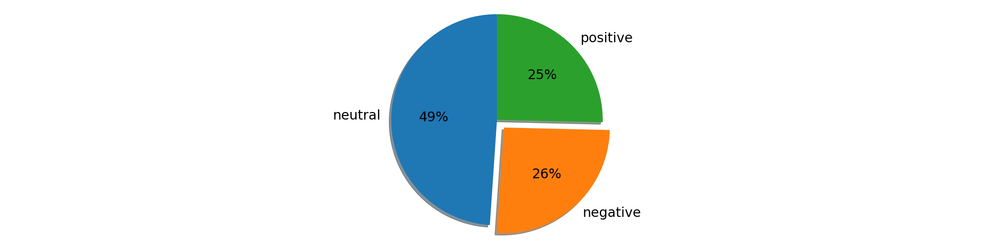

In [137]:
# Pie chart to visualize the share of sentiments
labels = relevant["sentiment"].unique()
sizes = relevant['sentiment'].value_counts()
explode = (0, 0.1, 0)

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, textprops={'fontsize': 30}, autopct='%1.0f%%',shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

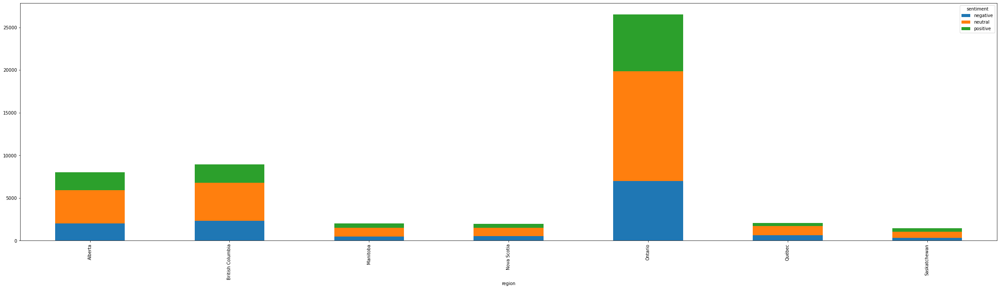

In [139]:
#distribution of sentiments among the major provinces
relevant_prov.groupby(['region','sentiment']).size().unstack().plot(kind='bar',stacked=True)
plt.rcParams["figure.figsize"] = (40,10)

In [150]:
#wordcloud for the topics
def getwordcloud(a):
    topicmodel=relevant.loc[relevant['Topic'] == a]
    topicmodel= topicmodel[['tweet_text', 'Topic']].copy()
    
    text = " ".join(i for i in topicmodel.tweet_text)
    wordcloud = WordCloud(stopwords=stop_words, background_color="white",max_words=100,max_font_size=500,font_step=2,width=1500,height=820).generate(text)
    plt.figure( figsize=(20,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

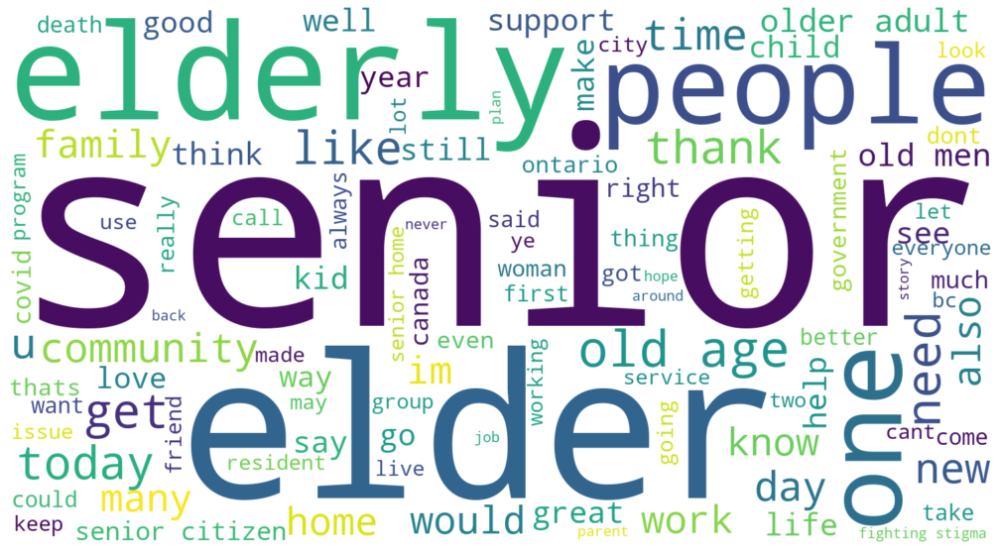

In [151]:
#word cloud for topic -1
getwordcloud(-1)

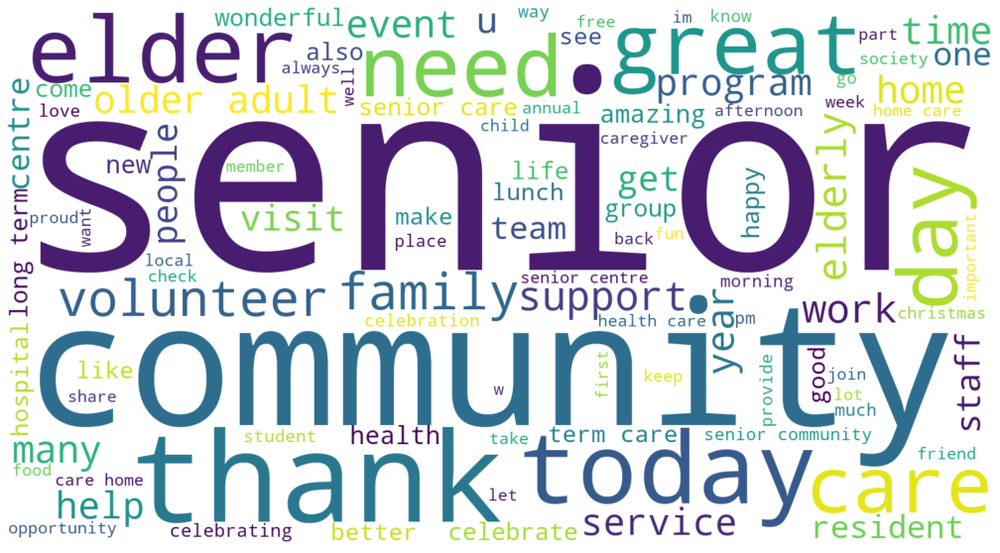

In [152]:
#word cloud for topic 0
getwordcloud(0)

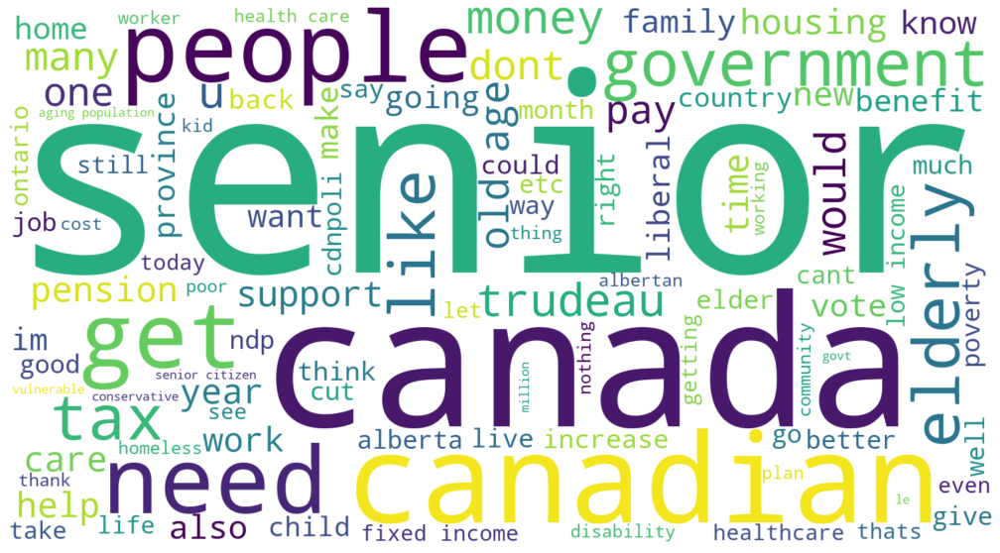

In [153]:
#word cloud for topic 1
getwordcloud(1)

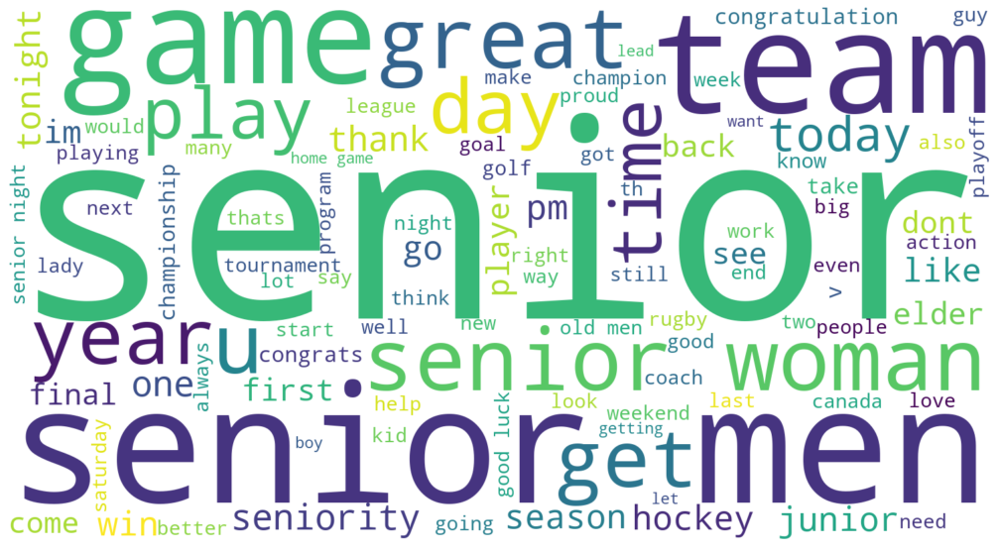

In [154]:
#word cloud for topic 2
getwordcloud(2)

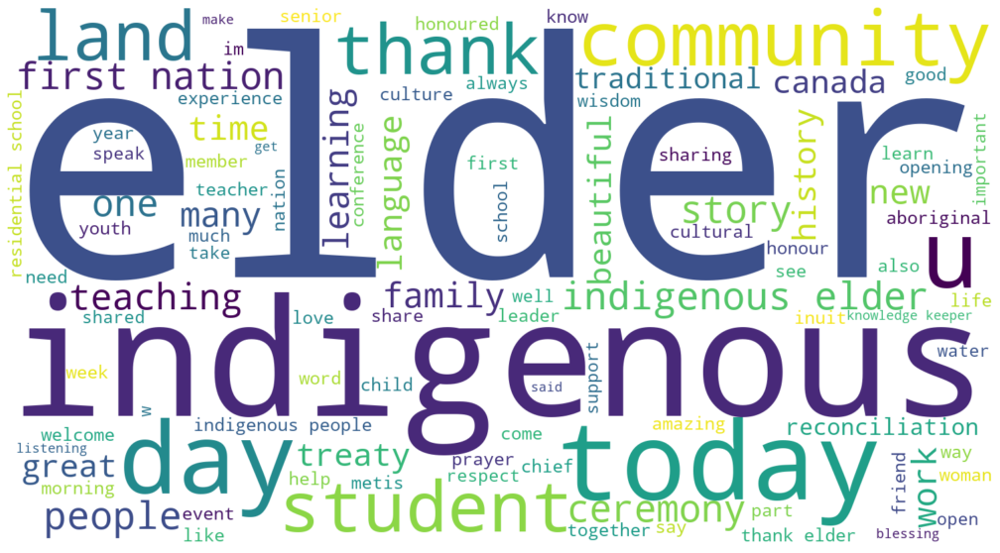

In [155]:
#word cloud for topic 3
getwordcloud(3)

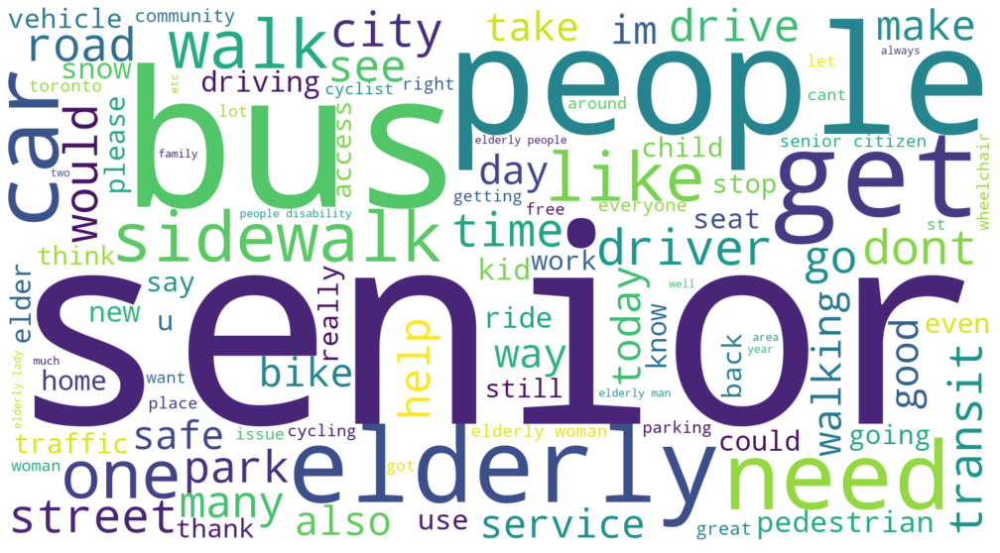

In [156]:
#word cloud for topic 4
getwordcloud(4)

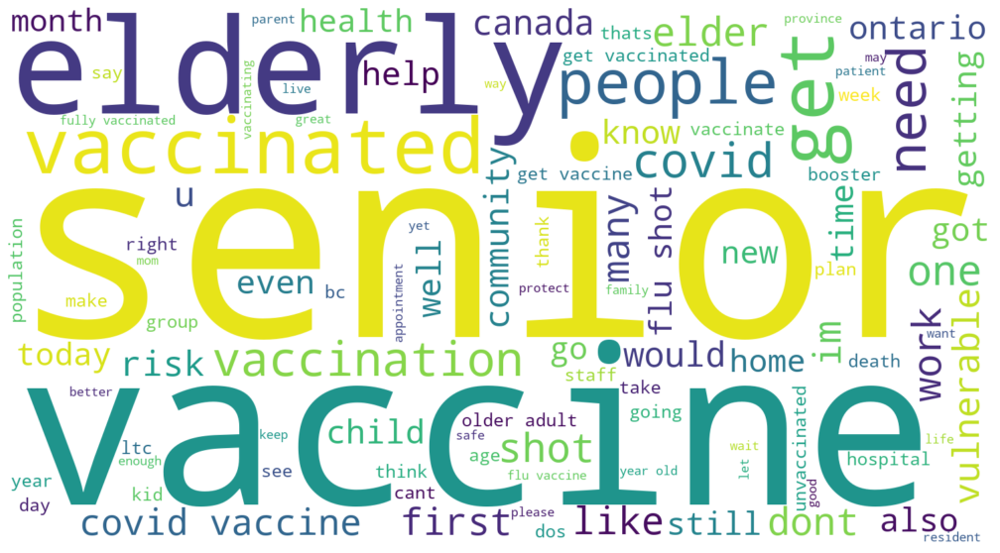

In [157]:
#word cloud for topic 5
getwordcloud(5)

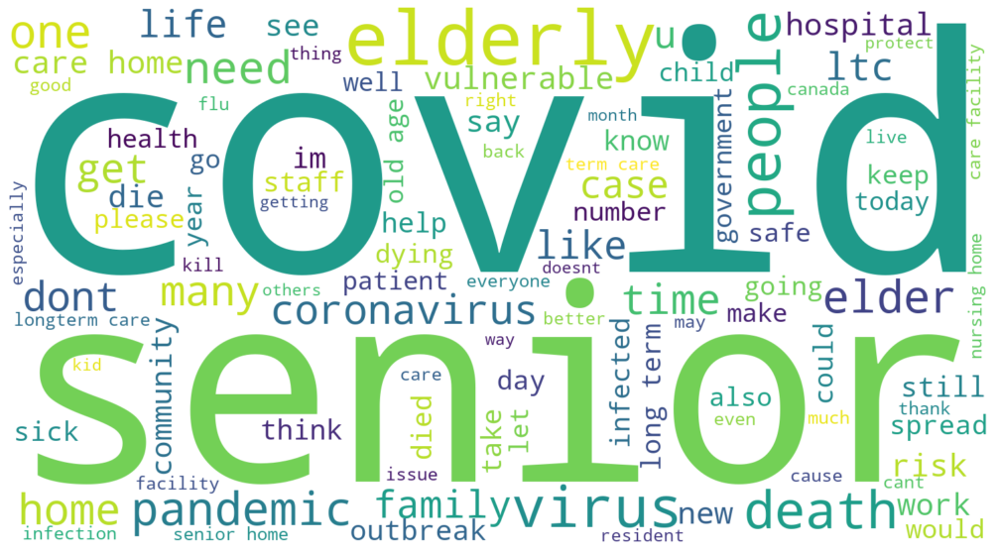

In [158]:
#word cloud for topic 6
getwordcloud(6)

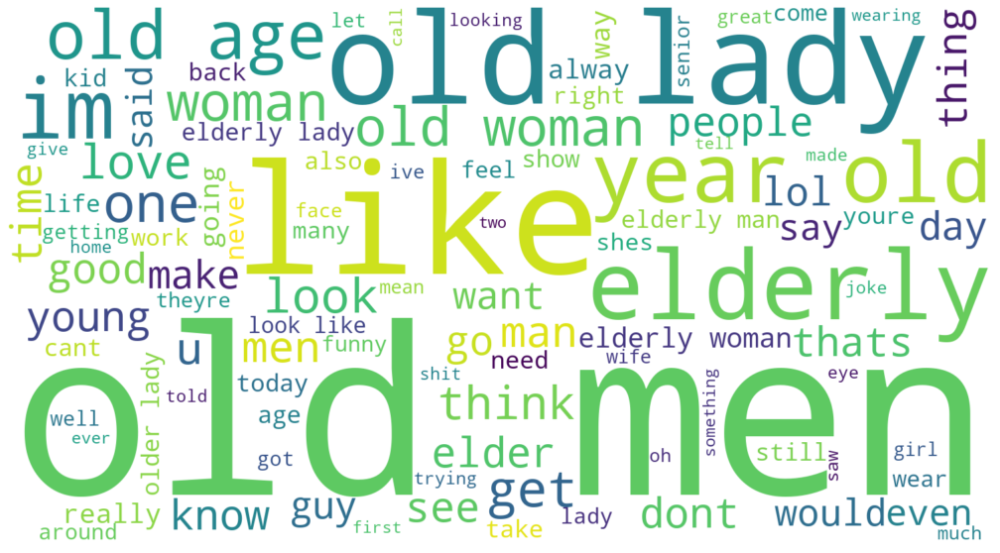

In [159]:
#word cloud for topic 7
getwordcloud(7)

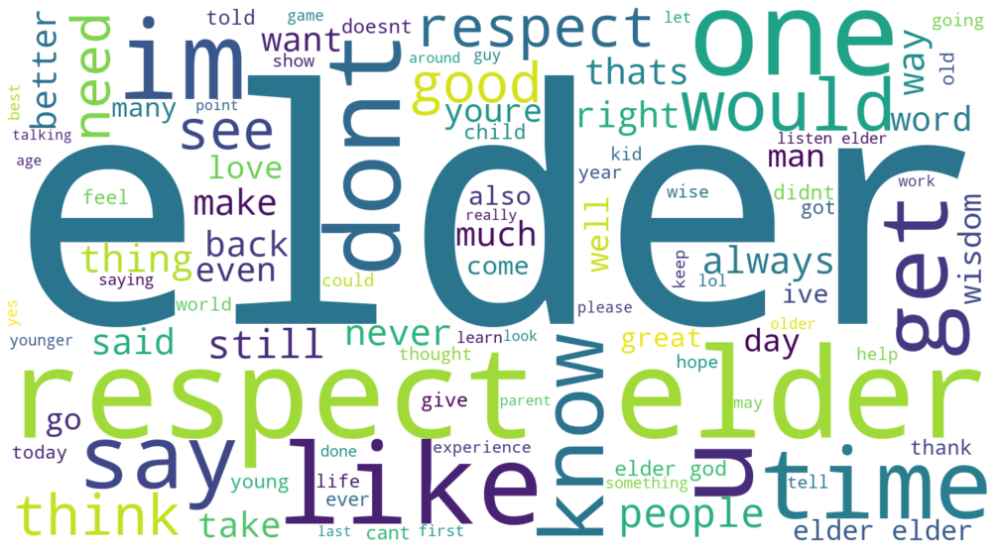

In [160]:
#word cloud for topic 8
getwordcloud(8)

In [181]:
#creating duplicate for visualization
relevant_cos = relevant

<AxesSubplot:>

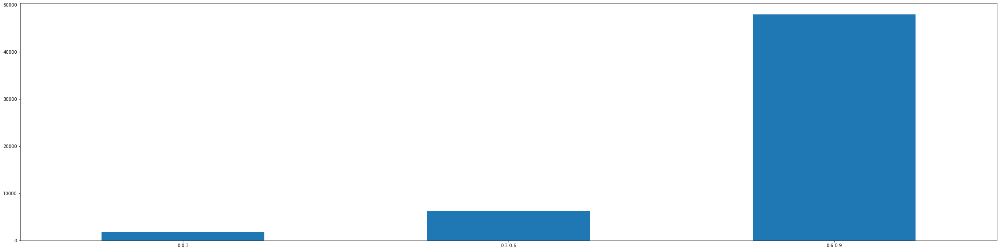

In [182]:
#distribution of cosine scores
labels = ['0-0.3', '0.3-0.6', '0.6-0.9']
relevant_cos['cos'] = pd.cut(relevant_cos['cos'], bins=3, labels=labels, include_lowest=True)

relevant['cos'].value_counts(sort=False).plot.bar(rot=0)